## NieR: Automata Tone Filter Prototype

Jump to results [here](#8-bit-Music)


Original explorations done at the summer 2019 Microsoft Hackathon. To hear the audio (doesn't work from GitHub), check out the notebook hosted on [Azure Notebooks](link here!) 

NieR: Automata is such an amazing game to be experienced (I can say much, much more about it. No spoilers here, but it's a game that's art on so many levels and shouldn't be judged by the cover). There are a bunch of different genres of gameplay in the game (hack and slash, sidescrolling platformer, bullet hell from different camera angles, etc.). Note: when I say 8 bit versions, I'm referring to the chiptune/8-bit style, not audio with a literal bit depth of 8. 

The specific audio effect I wanted to talk about is the tone filter, which when applied to a track, gives it an 8-bit style. In the transition between hack and slash in the outside gameworld to the hacking, a top down, side, or isometric bullet hell sequence in a virtual world, the music transitions from the high fidelity version of the soundtrack to the 8-bit style version.

Check out their [great GDC talk](https://www.youtube.com/watch?v=BrUQdd96qzk) about this and other real time audio processing effects in the game and their [blog post](https://www.platinumgames.com/official-blog/article/9581) for more details specifically about the tone filter. There's videos examples and cool stuff! 

Platinum originally just tried crossfading between the high fidelity and 8-bit versions, but to make the transition even smoother, ended up fading the high fidelity to a tone filtered version to the 8-bit version. There was also another use of the tone filter: to create the 8-bit versions themselves. While for many of the tracks, separate 8 bit versions were created, for other tracks like "Copied City", the 8-bit versions are a mix of the original orchestral version and the tone filtered version.  

I found an implementation online [here](http://themaister.net/blog/2019/02/23/recreating-the-tone-filter-from-nierautomata/) in C++ with some nice performance optimizations, but I still wanted to try to make my own based on what Platinum Games has revealed. Theirs was done as a Wwise plugin in C++, but I chose to use Python to make a quick (and yes, very inefficient) prototype for the hackathon. 

In [428]:
!pip install numpy
!pip install scipy==1.2.0
!pip install matplotlib

In [429]:
import numpy as np
from IPython.display import Audio
from scipy.io import wavfile
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline

## Mono and Reducing Bit Depth

Let's see what the audio data looks like.

In [430]:
# Standard CD sampling rate is 44.1 kHz, bit depth 16 bits, stereo
# Stereo data format: data[i] is [left_value, right_value] for sample i
sample_rate, data = wavfile.read('copied_city_intro.wav')
print("sample rate: ", sample_rate)
print(data[:2])
print(type(data[0][0]))

sample rate:  44100
[[-1266   502]
 [-1339   257]]
<class 'numpy.int16'>


Now, let's convert to mono (one channel)

In [431]:
# converting 2 channels of audio to 1 by averaging
def stereo_to_mono(data):
    # return [0.5*data[:,0][i] + 0.5*data[:,1][i] for i in range(len(data))]    
    return np.mean(data, axis=1)

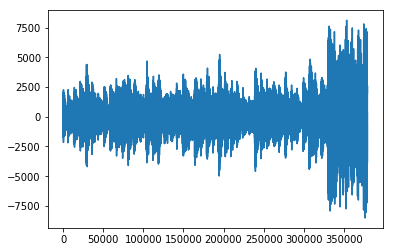

In [432]:
mono_data = stereo_to_mono(data)
plt.plot(mono_data)
Audio(mono_data, rate=sample_rate)

In [433]:
eq = stereo_to_mono(data) == [0.5*data[:,0][i] + 0.5*data[:,1][i] for i in range(len(data))]

In [434]:
eq2 =  stereo_to_mono(data) == np.average(data, axis=1)

In [435]:
print(list(eq2).count(False))
print(list(eq2).count(True))

0
379260


If we want to bit reduce, why not just bit crush the 16 bit ints into 8 bit ones?
To truncate off the 8 least significant bits, we can simply divide by $2^8$ and convert it to an int8


In [436]:
bit_reduce = np.int8(mono_data / (2**8))

In [437]:
bit_reduce

array([-1, -2, -2, ...,  9,  8,  7], dtype=int8)

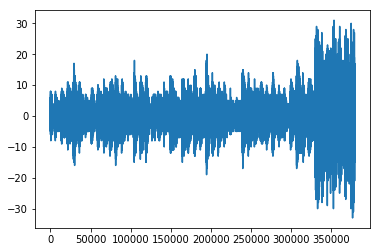

In [438]:
plt.plot(bit_reduce)
Audio(bit_reduce, rate=sample_rate)

Still sounds pretty normal, but with some added noise. Let's further reduce the bit depth to 6 bits. 

In [439]:
bit_reduce_6 = np.int8(bit_reduce / (2**2))

In [440]:
type(bit_reduce_6[0])

numpy.int8

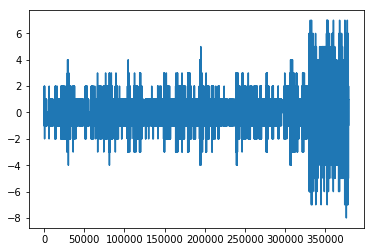

In [441]:
plt.plot(bit_reduce_6)
# warning: may be a bit loud! 
Audio(bit_reduce_6, rate=sample_rate)

Now we're getting somewhere but the background still sounds pretty normal. What if we just floor divide and keep the values at float64 (what NumPy automatically uses for operations)?

In [442]:
bit_reduce_6_floor = np.floor_divide(mono_data, 2 ** 10)

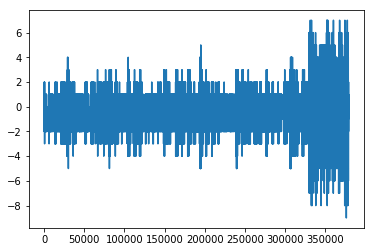

In [443]:
plt.plot(bit_reduce_6_floor)
Audio(bit_reduce_6_floor, rate=sample_rate)

It's (slightly) more pleasant, and goes to show how reducing bit depth is tricky (check out dithering). Instead of manually manipulating bit depth, let's try to continue the way Platinum Games got their 8 bit effect to work. 

## Designing Bandpass Filters
After converting stereo to mono, the first step is to separate out the 48 tones (4 octaves worth of musical notes).

Just a quick explanation of why you can't take an simple FFT (convert to the frequency domain, and then identify notes based on frequency): The corresponding frequencies for our standard musical notes are exponentially spaced while FFT bins are linear. 

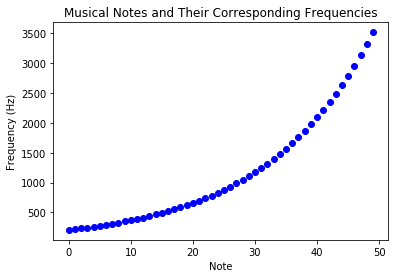

In [444]:
#music note freqs
A4 = 440.0 # standard frequency of A4
NOTES_PER_OCTAVE = 12
NUM_TONES = 50 # 4 octaves + 2 additional notes on either end
FS = 44100 #standard audio sampling rate
FREQS = [] # music note freqs from G#2 (207.65 Hz) to A7 (3520)

for i in range(NUM_TONES):
    # formula for how notes correspond to pitches in the Western classical music tradition
    FREQS.append(A4 * 2**(((i-1) - NOTES_PER_OCTAVE) / NOTES_PER_OCTAVE)) 
    
plt.plot(FREQS, 'bo')
plt.xlabel('Note')
plt.ylabel('Frequency (Hz)')
plt.title('Musical Notes and Their Corresponding Frequencies')

We're going to use 48 sharp bandpass filters, centered around each of the note frequencies. After experimentation, I decided to use Butterworth filters, which are designed to have an especially flat passband frequency response. 

To figure out how the filters work, let's try to separate out the 3rd from a chord: taking out 277.18 Hz (C#) frequency from the 329.64 Hz (E above) and 220 Hz frequency (A below). 

In [445]:
# The C# we're going to remove
t = np.linspace(0, 1, FS, False)  # time samples for 1 second
c_sharp = np.sin(2 * np.pi * 277.18 * t)
Audio(data=c_sharp, rate=44100)

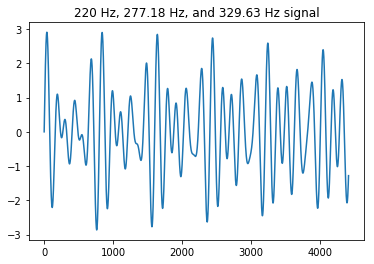

In [446]:
sr = FS
t = np.linspace(0, 1, sr, False)  # time samples for 1 second
test_sig = np.sin(2 * np.pi * 220 * t) + np.sin(2 * np.pi * 277.18 * t) +  np.sin(2 * np.pi * 329.63 * t)
plt.plot(test_sig[:4410]) #only plot 0.1 second
plt.title('220 Hz, 277.18 Hz, and 329.63 Hz signal')
Audio(data=test_sig, rate=sr)

In [447]:
# Nyquist frequency by definition
NYQ = FS / 2

# return b, a for butter filter centered around certain frequency
def construct_btr(prev, center, nxt):
    order, wn = signal.buttord(
        # passband from midway between previous and center to midway between center and next 
        # because of the previously mentioned exponential frequency growth, halfway probably isn't the best
        wp=[0.5 * (prev + center) / NYQ, 0.5 * (center + nxt) / NYQ], 
        ws=[prev / NYQ, nxt / NYQ], 
        gpass=5, 
        gstop=20, # in db, so 1/10th 
    )
    return signal.butter(order, wn, 'band')

In [448]:
# return filtered signal
def apply_filter(b, a, sig):
    # another option is to use lfilter, which only does a single pass
    # but filtfilt (forward and back) smooths out the edges better 
    # and has no phase shift
    return signal.filtfilt(b, a, sig)

In [449]:
# return filtered signal
# not used, but would be more applicable to real time processing 
def apply_filter_l(b, a, sig):
    return signal.lfilter(b, a, sig)

Let's apply the filter which should separate out the C#:

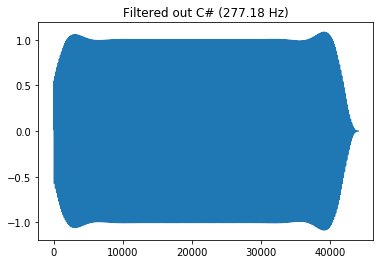

In [450]:
filt_test_sig = apply_filter(*construct_btr(*FREQS[4:7]), test_sig)
plt.plot(filt_test_sig)
plt.title('Filtered out C# (277.18 Hz)')
Audio(data=filt_test_sig, rate=FS)

Zooming in, let's see how well our filter did, and then subtract out the C# to get an open 5th. 

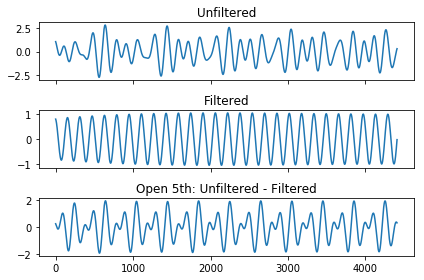

In [451]:
fig, (ax1, ax2, ax3) = plt.subplots(3, sharex=True)
ax1.plot(test_sig[1000:5410])
ax1.set_title('Unfiltered')
ax2.plot(filt_test_sig[1000:5410])
ax2.set_title('Filtered')
ax3.plot(test_sig[1000:5410] - filt_test_sig[1000:5410])
ax3.set_title('Open 5th: Unfiltered - Filtered')
fig.tight_layout()
Audio(test_sig - filt_test_sig, rate=FS)

## Separating out 48 Tones 


Now let's apply this to some real music that isn't just pure tones. 

In [452]:
def separate_tones(sig):
    separated = np.empty((0, len(sig)))
    for i in range(1, len(FREQS) - 1): 
        b, a = construct_btr(FREQS[i - 1], FREQS[i], FREQS[i + 1])
        res = np.array(apply_filter(b, a, sig))
        separated = np.vstack((separated, res))
    return separated

In [453]:
separated = separate_tones(mono_data)

Let's see how much Ab (415.30 Hz) contributes to this sample:

415.3046975799451


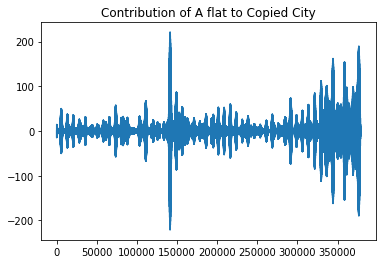

In [454]:
A_flat_index = 12
print(FREQS[A_flat_index])
plt.plot(separated[A_flat_index])
plt.title('Contribution of A flat to Copied City')
Audio(data=separated[A_flat_index], rate=FS)

Here are the rest: 

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


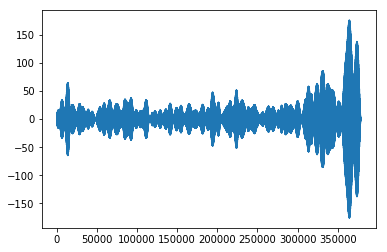

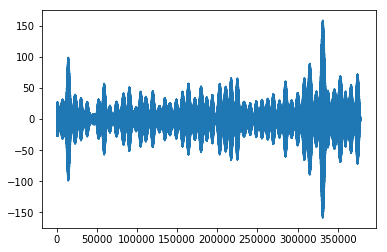

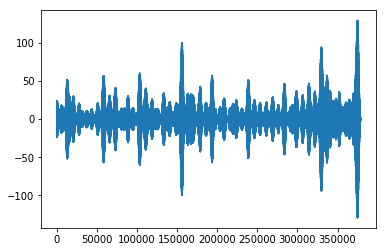

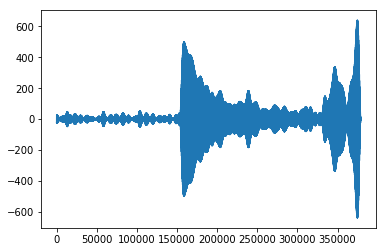

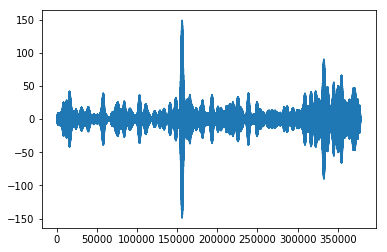

...

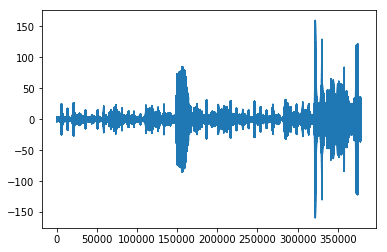

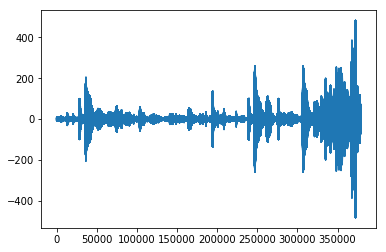

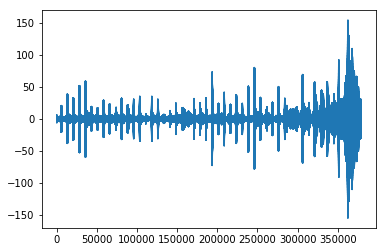

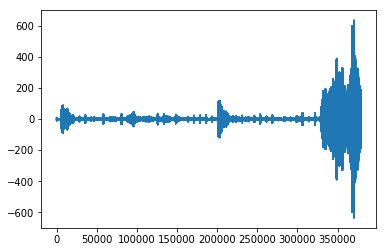

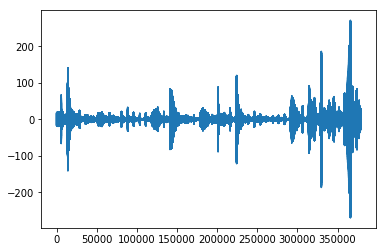

In [455]:
for tone in separated:
    plt.figure()
    plt.plot(tone)

If we combine all the separated signals, we should get our original signal back. 

In [456]:
summed = np.sum(separated, axis=0)

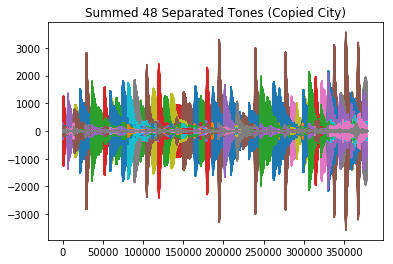

In [457]:
for tone in separated:
    plt.plot(tone)
plt.title('Summed 48 Separated Tones (Copied City)')
Audio(data=summed, rate=FS)

Here's another music example (Bach Partita for Violin in E Major BWV 1006, Gavotte en rondeau)

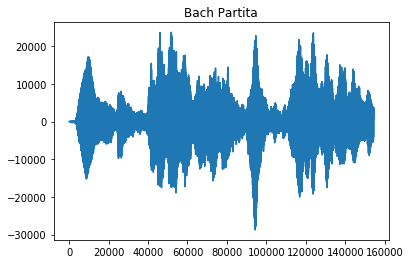

In [458]:
sample_rate, data = wavfile.read('bach_partita.wav')
bach = stereo_to_mono(data) 
n_sec = 3.5
bach = bach[:int(sample_rate*n_sec)]

plt.plot(bach)
plt.title('Bach Partita')
Audio(data=bach, rate=sample_rate)

In [459]:
bach_separated = separate_tones(bach)
bach_summed = np.sum(bach_separated, axis=0)

Let's check out A4 (880 Hz), since it's in E Major. 

880.0


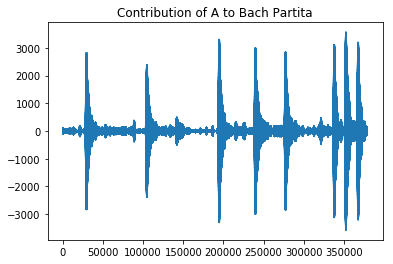

In [460]:
A_index = 25
print(FREQS[A_index])
plt.plot(separated[A_index])
plt.title('Contribution of A to Bach Partita')
Audio(data=bach_separated[A_index], rate=FS)

Just separating the 48 tones dampens out the sound anyways. 

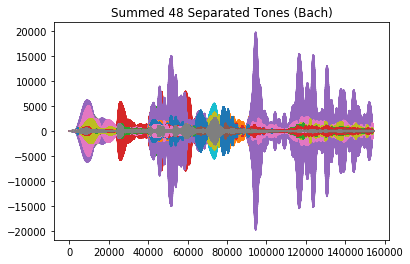

In [461]:
for tone in bach_separated:
    plt.plot(tone)
plt.title('Summed 48 Separated Tones (Bach)')
Audio(data=bach_summed, rate=FS)

## Distortion

After we've separated out the tones, we want to apply some distortion to get the 8 bit style we're looking for. Basically, we want to turn the wavy sine waves into more harsh square waves. 

In [462]:
def distort(data, dist_fn):
    return np.array(list(map(dist_fn, data)))

Some distortion functions

In [463]:
dist_1 = lambda x: np.tanh(x)

In [464]:
dist_2 = lambda x: x / (1 + abs(x))

In [465]:
dist_3 = lambda x: np.arctan(x)

In [466]:
def cubic_nonlin(x, thres):
    if x <= -thres: return -2/3
    elif x >= thres: return 2/3
    else: return x - (np.power(x, 3) / 3)
dist_4 = lambda x: cubic_nonlin(x, 2)

Distorting and leveling based on peak to peak "power". It's interesting that the order of the distortion/clipping and leveling steps are switched in the diagrams from the Platinum Games blog and the GDC talk. 

In [467]:
def power(data, window):
    res = []
    for i in range(0, len(data), window):
        res.append(np.ptp(data[i : i + window]))
    return res

def distort_and_level(separated, original, window, threshold, reduced_amt, dist_fn):
    assert window > 0
    original_power = power(original, window)
    res = []
    lowered_counts = []
    
    for s in separated: 
        distorted_power = power(s, window)
        dis = distort(s, dist_fn)
        count = 0
        for i in range(0, len(s), window):
            power_index = int(i / window)
            if distorted_power[power_index] / original_power[power_index] < threshold:
                count += 1
                dis[i: i + window] = reduced_amt * dis[i: i + window] 
        lowered_counts.append(count / int(round(len(s)/window)))
        res.append(dis)
        
#     plt.plot(lowered_counts)
    return np.add.reduce(res)

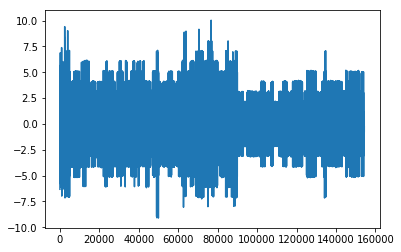

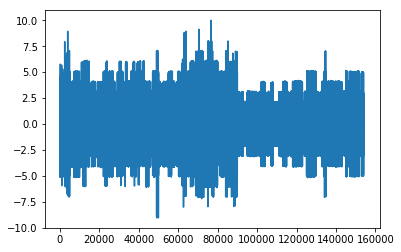

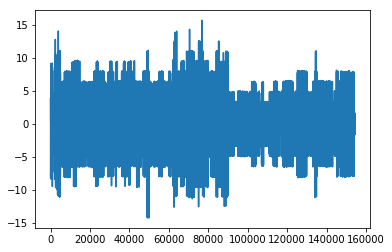

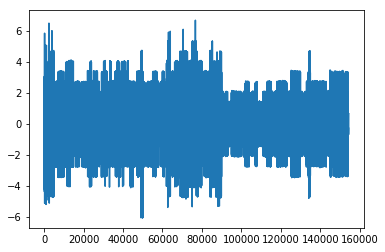

In [468]:
for fn in [dist_1, dist_2, dist_3, dist_4]:
    dis = distort_and_level(bach_separated, bach, 
                         window=1000, threshold=0.1, reduced_amt=0.01, 
                         dist_fn=fn)
    plt.figure()
    plt.plot(dis)
    display(Audio(data=dis, rate=FS))

There was a lot more trial and error than show here; I had a lot of trouble finding an appropriate distortion function and associated parameters that didn't create too much noise or sound like some guitar effect (cool in my opinion, but not the 8 bit style we're aiming for here). 

I ultimately decided to create square waves (using scipy.signal.square) myself and scale them based on the peak to peak amplitude of the separated tones. This worked out surprisingly well, even without any leveling. 

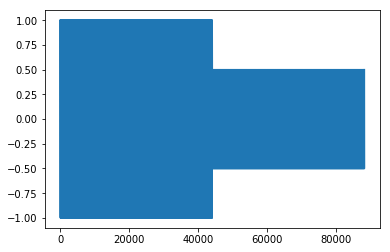

In [469]:
# Testing combining scaled generated square signals horizontally
t1 = np.linspace(0, 1, FS)
t2 = np.linspace(1, 2, FS)
sin1 = 1 * signal.square(2* 440 * np.pi * t1)
sin2 = 0.5 * signal.square(2 * 440 * np.pi * t2)
combined = np.hstack((sin1, sin2))
plt.plot(combined)
Audio(data=combined, rate=FS)

In [470]:
# for each window, create a square wave at the specific frequency,
# scaled by the peak to peak amplitude of the original data
# win size in samples
def custom_distort(separated_data, freq, window_size):
    # number of samples
    length = len(separated_data) 
    res = np.array([])
    
    # in units of samples 
    for i in range(0, length, window_size):
        # handling edge case of the last window 
        window_end = min(length, i + window_size)
        # in units of seconds, divide by FS to get seconds 
        window = np.linspace(i / FS, window_end / FS, (window_end - i))
        power = np.ptp(separated_data[i : i + window_size])
        sq = power * signal.square(2 * np.pi * freq * window)
        res = np.hstack((res, sq))
    return res

The separated A from before, 8 bit version.

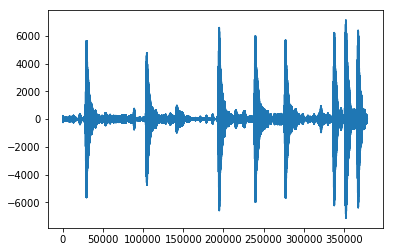

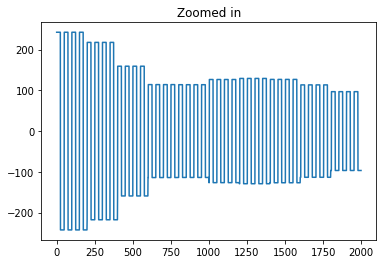

In [471]:
res = custom_distort(separated[A_index], 880, 200)
plt.plot(res)
plt.figure()
plt.title("Zoomed in")
plt.plot(res[:2000])
Audio(data=res, rate=FS)

Let's combine all the processing together

In [472]:
def process_audio(data):
    separated = separate_tones(data)
    total = np.zeros(len(data))

    for i in range(len(separated)):
        dist = custom_distort(separated[i], FREQS[i + 1], 500)
        total = np.add(total, dist)
    return total

## 8 bit Music

Now, with some actual NieR: Automata music

In [473]:
sample_rate, data = wavfile.read('copied_city_intro.wav')
copied_city = stereo_to_mono(data) 

The original:

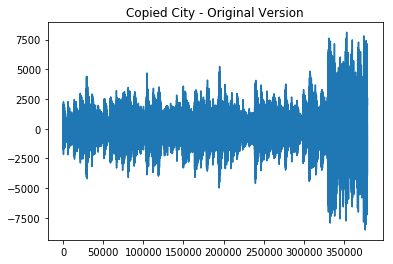

In [474]:
plt.plot(copied_city)
plt.title("Copied City - Original Version")
Audio(data=copied_city, rate=FS)

In [475]:
copied_city_8b = process_audio(copied_city)

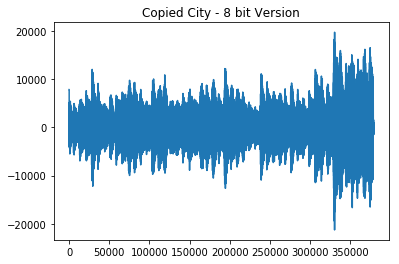

In [476]:
plt.plot(copied_city_8b)
plt.title("Copied City - 8 bit Version")
Audio(data=copied_city_8b, rate=FS)

## More Examples

In [477]:
sample_rate, data = wavfile.read('fur_elise.wav')
start = 5
duration = 8
fur_elise = stereo_to_mono(data[int(FS * start):int(FS * (start + duration))])

The original:

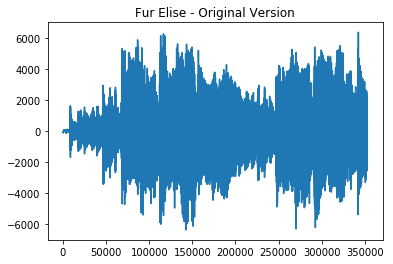

In [478]:
plt.plot(fur_elise)
plt.title("Fur Elise - Original Version")
Audio(data=fur_elise, rate=FS)

In [479]:
fur_elise_8b = process_audio(fur_elise)

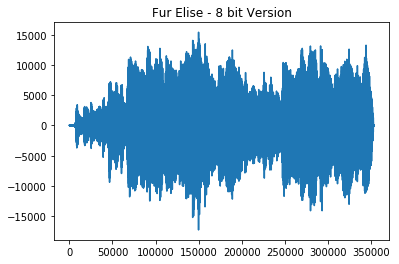

In [480]:
plt.plot(fur_elise_8b)
plt.title("Fur Elise - 8 bit Version")
Audio(data=fur_elise_8b, rate=FS)

In [481]:
sample_rate, data = wavfile.read('bach_partita.wav')
start = 1
duration = 4
bach_partita = stereo_to_mono(data[int(FS * start):int(FS * (start + duration))])

The original:

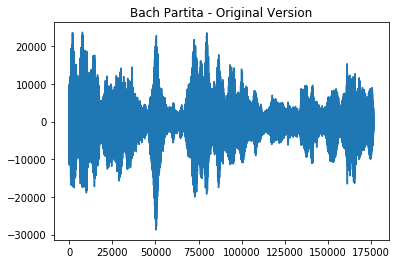

In [482]:
plt.plot(bach_partita)
plt.title("Bach Partita - Original Version")
Audio(data=bach_partita, rate=FS)

In [483]:
bach_partita_8b = process_audio(bach_partita)

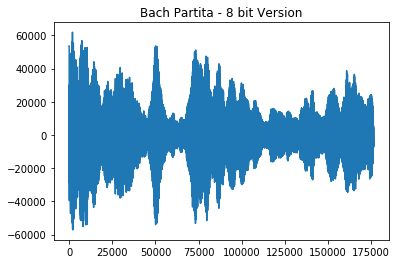

In [484]:
plt.plot(bach_partita_8b)
plt.title("Bach Partita - 8 bit Version")
Audio(data=bach_partita_8b, rate=FS)

That's all for now; in the future I'd like to make this sound better for music with dense textures and lyrics. It would also be a cool project to convert this to C++ as a Wwise plugin (and optimize it!), which is how this was used to modify the audio in the game. 